<a href="https://www.kaggle.com/code/arkabarua173/bank-churn?scriptVersionId=175692238" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

<div style="background-color: #092635;
            box-sizing: border-box;
            color: #FAF5EF;
            display:fill;
            padding: 10px 20px;
            text-wrap: balance;
            border-radius:8px;
            border: 2px solid #FAF5EF">
    <h1 style="font-family: Arial; font-size: 28pt;"><b>Bank Churn Binary Classification Problem</b></h1>
    
<h4 style="font-family: Arial; font-size: 16pt;">📌 <b>Objective:</b></h4>
<ul><li style='font-size: 12pt;'>Predicting the probabilities of exiting the bank.</li></ul>

<h4 style="font-family: Arial; font-size: 16pt;">📄 <b>Dataset Description:</b></h4>
<ul>
    <li style='font-size: 12pt;'><b>CustomerId: </b>This is a unique identifier for each customer.</li>
    <li style='font-size: 12pt;'><b>Surname: </b>The surname of each customer. Nominal variable.</li>
    <li style='font-size: 12pt;'><b>CreditScore: </b>The credit score of each customer. Continuous Variable.</li>
    <li style='font-size: 12pt;'><b>Geography: </b>Indicates the country where the customer resides. In this dataset (Germany, Spain & France).</li>
    <li style='font-size: 12pt;'><b>Gender: </b>The gender of each customer.</li>
    <li style='font-size: 12pt;'><b>Age: </b>The age of each customer. Continuous Variable.</li>
    <li style='font-size: 12pt;'><b>Tenure: </b>The number of years the customer has been with the bank.  Continuous Variable.</li>
    <li style='font-size: 12pt;'><b>Balance: </b>The account balance of each customer. Continuous Variable.</li>
    <li style='font-size: 12pt;'><b>NumOfProducts: </b>The number of bank products the customer uses. </li>
    <li style='font-size: 12pt;'><b>HasCrCard: </b>Indicates whether the customer has a credit card (1 for yes, 0 for no).</li>
    <li style='font-size: 12pt;'><b>IsActiveMember: </b>Specifies whether the customer is an active member (1 for yes, 0 for no).</li>
    <li style='font-size: 12pt;'><b>EstimatedSalary: </b>Represents the estimated salary of the customer. Continuous Variable.</li>
    <li style='font-size: 12pt;'><b>Exited: </b>This is the target variable and indicates whether the customer has exited the bank (1 for yes, 0 for no).</li>
</ul>

<h4 style="font-family: Arial; font-size: 16pt;">🔨 <b>Data Preprocessing</b></h4>
<ul>
    <li style='font-size: 12pt;'><b>Mutual Information</b> is used for selecting features.</li>
    <li style='font-size: 12pt;'><b>One Hot Encoder</b> used for categorical value (In this dataset (Gender & Geography))</li>
</ul>

<h4 style="font-family: Arial; font-size: 16pt;">🤖 <b>Models Used:</b></h4>
<ol>
    <li style='font-size: 12pt;'>XGBoost</li>
</ol>

<h4 style="font-family: Arial; font-size: 16pt;">🔍 <b>Evaluation Metrics:</b></h4>
<ol>
    <li style='font-size: 12pt;'>AUC ROC score, or Area Under the Curve Receiver Operating Characteristic score is used as the primary metric because our dataset is imbalanced.</li>
    <li style='font-size: 12pt;'>Other than AUC ROC score, or Accuracy, Precision, F1 score, Recall is used to analyze the model</li>
    <li style='font-size: 12pt;'>SHAP (SHapley Additive exPlanations) is used to understand model output</li>
</ol>
</div>

<div style="background-color: #092635;
            box-sizing: border-box;
            color: #FAF5EF;
            display:fill;
            padding: 10px 20px;
            text-wrap: balance;
            border-radius:8px;
            border: 2px solid #FAF5EF">
<a id = "table-of-content"></a>
<h3 style="font-family: Arial; font-size: 16pt;">📋 <b>Table of Content</b></h3>
    
<ol style="color: #FAF5EF">

<li> <a href="#import" style="color: #FAF5EF;">Importing Libraries</a></li>
<li> <a href="#dataset" style="color: #FAF5EF;">Loading Dataset</a></li>
<li> <a href="#basic" style="color: #FAF5EF;">Basic Data Exploration</a></li>
<li> <a href="#viz" style="color: #FAF5EF;">Data Viz</a></li>
<li> <a href="#process" style="color: #FAF5EF;">Data Preprocessing</a></li>
<li> <a href="#xgb" style="color: #FAF5EF;">XGBoost</a></li>
<li> <a href="#evaluation" style="color: #FAF5EF;">Model Evaluation</a></li>
<li> <a href="#submission" style="color: #FAF5EF;">Submission</a></li>
<li> <a href="#shap" style="color: #FAF5EF;">SHAP (SHapley Additive exPlanations)</a></li>
    </ol>
    
</div>

<a id = "import"></a>
# 📦 Importing Libraries

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff
import sklearn
sklearn.set_config(transform_output="pandas")
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score, precision_score, f1_score, recall_score,  roc_curve, roc_auc_score, classification_report
pd.options.plotting.backend = "plotly"
from xgboost import XGBClassifier, plot_importance, to_graphviz
import shap
import warnings
warnings.simplefilter("ignore")

plt.style.use('seaborn-v0_8-darkgrid')

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/playground-series-s4e1/sample_submission.csv
/kaggle/input/playground-series-s4e1/train.csv
/kaggle/input/playground-series-s4e1/test.csv


<a id='dataset'></a>
# 🔃 Loading Dataset

In [2]:
train_path = '/kaggle/input/playground-series-s4e1/train.csv'
df = pd.read_csv(train_path, index_col='id')
df.head()

,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
id,,,,,,,,,,,,,
0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0
1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0
2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0
3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0
4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0


In [3]:
test_path = '/kaggle/input/playground-series-s4e1/test.csv'
test_df = pd.read_csv(test_path, index_col='id')
test_df.head()

,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
id,,,,,,,,,,,,
165034,15773898,Lucchese,586,France,Female,23.0,2,0.00,2,0.0,1.0,160976.75
165035,15782418,Nott,683,France,Female,46.0,2,0.00,1,1.0,0.0,72549.27
165036,15807120,K?,656,France,Female,34.0,7,0.00,2,1.0,0.0,138882.09
165037,15808905,O'Donnell,681,France,Male,36.0,8,0.00,1,1.0,0.0,113931.57
165038,15607314,Higgins,752,Germany,Male,38.0,10,121263.62,1,1.0,0.0,139431.00


<a id='basic'></a>
# 🖇️ Basic Data Exploration

In [4]:
df.shape

(165034, 13)

In [5]:
df.dtypes

CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                float64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard          float64
IsActiveMember     float64
EstimatedSalary    float64
Exited               int64
dtype: object

In [6]:
df.describe()

,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,1.650340e+05,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000
mean,1.569201e+07,656.454373,38.125888,5.020353,55478.086689,1.554455,0.753954,0.497770,112574.822734,0.211599
std,7.139782e+04,80.103340,8.867205,2.806159,62817.663278,0.547154,0.430707,0.499997,50292.865585,0.408443
min,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,11.580000,0.000000
25%,1.563314e+07,597.000000,32.000000,3.000000,0.000000,1.000000,1.000000,0.000000,74637.570000,0.000000
50%,1.569017e+07,659.000000,37.000000,5.000000,0.000000,2.000000,1.000000,0.000000,117948.000000,0.000000
75%,1.575682e+07,710.000000,42.000000,7.000000,119939.517500,2.000000,1.000000,1.000000,155152.467500,0.000000
max,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.000000,1.000000,199992.480000,1.000000


In [7]:
df.isna().sum()

CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

In [8]:
df.drop_duplicates(subset=['CustomerId', 'CreditScore', 'Age', 'Gender', 'Geography', 'Surname', 'Tenure', 'Balance', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary', 'Exited'], inplace=True)

In [9]:
numerical_cols = [cname for cname in df.columns if df[cname].dtype in ['int64', 'float64']]
categorical_cols = [cname for cname in df.columns if df[cname].dtype == "object"]

print('Numerical Columns: ', numerical_cols)
print('Categorical Columns: ', categorical_cols)

Numerical Columns:  ['CustomerId', 'CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary', 'Exited']
Categorical Columns:  ['Surname', 'Geography', 'Gender']


In [10]:
unique_counts = df[categorical_cols].nunique()
unique_values = df[categorical_cols].apply(lambda x: x.unique())

pd.DataFrame({'Number of Unique Values': unique_counts, 'Unique Values': unique_values})

,Number of Unique Values,Unique Values
Surname,2797,"[Okwudilichukwu, Okwudiliolisa, Hsueh, Kao, Ch..."
Geography,3,"[France, Spain, Germany]"
Gender,2,"[Male, Female]"


In [11]:
df['Surname'].value_counts()

Surname
Hsia       2456
T'ien      2282
Hs?        1611
Maclean    1577
Kao        1574
           ... 
Kryukov       1
Sumrall       1
Liston        1
Ali           1
Coupp         1
Name: count, Length: 2797, dtype: int64

In [12]:
df['Geography'].value_counts()

Geography
France     94122
Spain      36177
Germany    34594
Name: count, dtype: int64

In [13]:
df['Gender'].value_counts()

Gender
Male      93068
Female    71825
Name: count, dtype: int64

In [14]:
df['Exited'].value_counts()

Exited
0    129994
1     34899
Name: count, dtype: int64

<a id='viz'></a>
# 📊 Data Viz

In [15]:
# Create countplot for the Gender
histogram1 = go.Histogram(x=df['Gender'], name='Gender')

# Create countplot for the Geography
histogram2 = go.Histogram(x=df['Geography'], name='Geography')

# Create subplots
fig = make_subplots(rows=1, cols=2)

# Add countplot for the Gender to subplot
fig.add_trace(histogram1, row=1, col=1)

# Add countplot for the Geography to subplot
fig.add_trace(histogram2, row=1, col=2)

# Update layout
fig.update_layout(title='Countplots')

# Show plot
fig.show()

***Key Observation***
- There are more male customers than female
- Most of them are from France

In [16]:
fig = px.histogram(df, x='Gender', color='Exited', facet_col='Geography')

fig.update_layout(title='Countplots of Gender and Geography with Exited',
                  xaxis=dict(title='Gender'), yaxis=dict(title='Count'))

fig.show()

***Key Observation***
- Female customers are more likely to exit than males.  

In [ ]:
df_hist = df[['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'EstimatedSalary']]

fig = make_subplots(rows=2, cols=4, subplot_titles=df_hist.columns)

fig.add_trace(go.Histogram(x=df['CreditScore'], name='CreditScore'), row=1, col=1)
fig.add_trace(go.Histogram(x=df['Age'], name='Age'), row=1, col=2)
fig.add_trace(go.Histogram(x=df['Tenure'], name='Tenure'), row=1, col=3)
fig.add_trace(go.Histogram(x=df['Balance'], name='Balance'), row=1, col=4)
fig.add_trace(go.Histogram(x=df['NumOfProducts'], name='NumOfProducts'), row=2, col=1)
fig.add_trace(go.Histogram(x=df['HasCrCard'], name='HasCrCard'), row=2, col=2)
fig.add_trace(go.Histogram(x=df['IsActiveMember'], name='IsActiveMember'), row=2, col=3)
fig.add_trace(go.Histogram(x=df['EstimatedSalary'], name='EstimatedSalary'), row=2, col=4)

# Update layout
fig.update_layout(title='Individual Displots of Eight Columns', showlegend=False)
fig.update_xaxes(title_text='Value', row=2, col=1)
fig.update_yaxes(title_text='Probability Density', row=1, col=1)

# Show plot
fig.show()

***Key Observation***
- Most customers age are between 25 to 45 years old.
- There are a lot of customers with balance 0.
- 1 and 2 are the most frequent value for number of products.

In [ ]:
df_hist = df[['CreditScore', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'IsActiveMember', 'EstimatedSalary']]

fig = make_subplots(rows=2, cols=4, subplot_titles=df_hist.columns)

fig.add_trace(go.Box(x=df['CreditScore'], name='CreditScore'), row=1, col=1)
fig.add_trace(go.Box(x=df['Age'], name='Age'), row=1, col=2)
fig.add_trace(go.Box(x=df['Tenure'], name='Tenure'), row=1, col=3)
fig.add_trace(go.Box(x=df['Balance'], name='Balance'), row=1, col=4)
fig.add_trace(go.Box(x=df['NumOfProducts'], name='NumOfProducts'), row=2, col=1)
fig.add_trace(go.Box(x=df['IsActiveMember'], name='IsActiveMember'), row=2, col=2)
fig.add_trace(go.Box(x=df['EstimatedSalary'], name='EstimatedSalary'), row=2, col=3)

# Update layout
fig.update_layout(title='Individual Box Plots of Seven Columns', showlegend=False)

# Rotate y-axis labels
fig.update_yaxes(tickangle=90)

# Show plot
fig.show()

In [ ]:
# Calculate Pearson correlation matrix
corr_matrix = df.corr(numeric_only=True)

# Round the correlation coefficient values to two decimal places
corr_matrix_rounded = corr_matrix.round(2)

# Create a heatmap
fig = ff.create_annotated_heatmap(
    z=corr_matrix_rounded.values,
    x=corr_matrix_rounded.columns.tolist(),
    y=corr_matrix_rounded.columns.tolist(),
    colorscale='Viridis',
    showscale=True  # Show color scale
)

# Update layout
fig.update_layout(
    title='Pearson Correlation Heatmap',
    xaxis=dict(title='Features'),
    yaxis=dict(title='Features'),
    font=dict(size=10),  # Adjust font size
    margin=dict(t=100, r=100),  # Adjust margins to prevent overlapping
)

# Show plot
fig.show()

***Key Observation***
- Age and Exited are positively correlated.
- Balance and NumOfProducts are negetively correlated.
- IsActiveMember and NumOfProducts are slightly negetively correlated with Exited.

<a id='process'></a>
# 🛠️ Data Preprocessing

- Dropping CustomerId and Surname because they should not make impact to the model.

In [ ]:
df.drop(columns=['CustomerId', 'Surname'], inplace=True)
test_df.drop(columns=['CustomerId', 'Surname'], inplace=True)

***Data spliting***

In [ ]:
X = df.drop(columns=['Exited'])
y = df['Exited']

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

***One Encoding***

- One Hot Encoder used for the categorical variables.

In [ ]:
ct = ColumnTransformer(
    transformers=[('cat', 
                   OneHotEncoder(sparse_output = False, handle_unknown='ignore'), 
                   ["Gender", "Geography"])], 
    remainder='passthrough'
)


X_train = ct.fit_transform(X_train)
X_test = ct.transform(X_test)
test_df = ct.transform(test_df)

In [ ]:
X_train.head()

***Mutual Information***
- Mutual Information can help us to understand the relative potential of a feature as a predictor of the target.

In [25]:
def make_mi_scores(X, y):
    mi_scores = mutual_info_classif(X, y)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores


mi_scores = make_mi_scores(X_train, y_train)
mi_scores

remainder__NumOfProducts      0.098331
remainder__Age                0.084548
remainder__IsActiveMember     0.040502
cat__Gender_Male              0.027712
cat__Geography_France         0.026451
cat__Geography_Germany        0.022892
cat__Gender_Female            0.019827
remainder__HasCrCard          0.018327
remainder__Balance            0.015586
remainder__EstimatedSalary    0.007673
cat__Geography_Spain          0.004768
remainder__CreditScore        0.004369
remainder__Tenure             0.003075
Name: MI Scores, dtype: float64

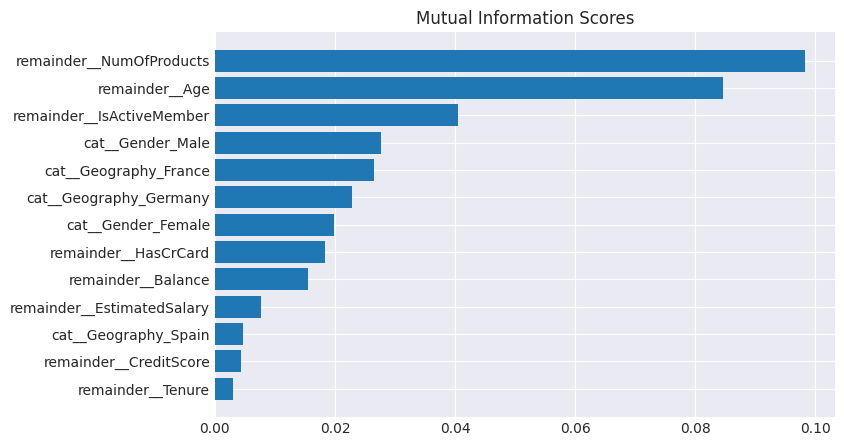

In [26]:
def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")


plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores)

In [27]:
X_train.drop(columns=['remainder__CreditScore', 'remainder__Tenure'], inplace=True)
X_test.drop(columns=['remainder__CreditScore', 'remainder__Tenure'], inplace=True)
test_df.drop(columns=['remainder__CreditScore', 'remainder__Tenure'], inplace=True)

In [28]:
X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=42)

In [29]:
Target_values = y_train.value_counts()
Target_values

Exited
0    103864
1     28050
Name: count, dtype: int64

In [30]:
weight = round(Target_values[0]/Target_values[1])
weight

4

<a id='xgb'></a>
# 🚀 XGBoost

- Param grid for xgboost hypertuning

In [31]:
param_grid = {
    'learning_rate': [0.01, 0.001, 0.1],
    'max_depth': [3, 5, 6, 7],
    'n_estimators': [300, 400, 500],
    'reg_alpha': np.arange(0.1, 1.0, 0.1),
    'reg_lambda': np.arange(0.1, 1.0, 0.1),
    'gamma': [0.2, 0.5, 1, 5, 0],
    'scale_pos_weight': [weight],
}

param_grid

{'learning_rate': [0.01, 0.001, 0.1],
 'max_depth': [3, 5, 6, 7],
 'n_estimators': [300, 400, 500],
 'reg_alpha': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
 'reg_lambda': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
 'gamma': [0.2, 0.5, 1, 5, 0],
 'scale_pos_weight': [4]}

In [32]:
clf_xgb = XGBClassifier(objective='binary:logistic',
                             seed=42,
                             random_state=42,
                             tree_method='hist',
                             device='cuda'
                        )

# Perform grid search
grid_search = RandomizedSearchCV(clf_xgb, param_grid, n_iter=10, cv=5, scoring='roc_auc', verbose=0)
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_
best_score = grid_search.best_score_

In [33]:
print('params', best_params)
print('score', best_score)

params {'scale_pos_weight': 4, 'reg_lambda': 0.30000000000000004, 'reg_alpha': 0.1, 'n_estimators': 500, 'max_depth': 6, 'learning_rate': 0.01, 'gamma': 0.5}
score 0.8886331694530207


In [34]:
clf_xgb = XGBClassifier(objective='binary:logistic',
                            early_stopping_rounds=20,
                            eval_metric=['auc', 'error'],
                            seed=42,
                            random_state = 42,
                            tree_method='hist',
                            device='cuda',
                            **best_params
                        )
clf_xgb.fit(X_train,
            y_train,
            verbose=False,
            eval_set=[(X_train, y_train), (X_val, y_val)])

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device='cuda', early_stopping_rounds=20,
              enable_categorical=False, eval_metric=['auc', 'error'],
              feature_types=None, gamma=0.5, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.01, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=500,
              n_jobs=None, num_parallel_tree=None, random_state=42, ...)

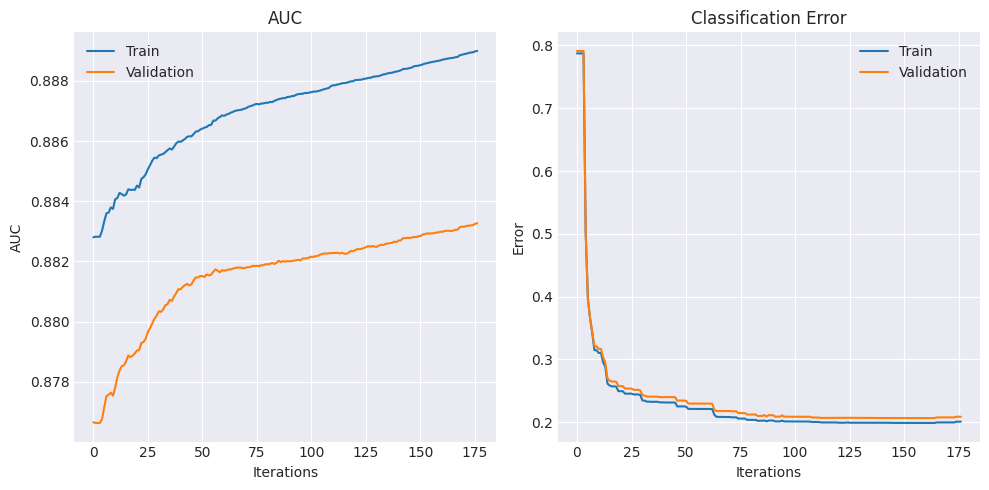

In [35]:
# Get the evaluation results
results = clf_xgb.evals_result()

# Extract the performance metrics for training set
train_auc = results['validation_0']['auc']
train_error = results['validation_0']['error']

# Check if there's only one validation set
if 'validation_1' in results:
    val_auc = results['validation_1']['auc']
    val_error = results['validation_1']['error']
else:
    # Set validation performance metrics to empty lists
    val_auc = []
    val_error = []

# Plot the performance graph
plt.figure(figsize=(10, 5))

# Plot AUC
plt.subplot(1, 2, 1)
plt.plot(train_auc, label='Train')
plt.plot(val_auc, label='Validation')
plt.title('AUC')
plt.xlabel('Iterations')
plt.ylabel('AUC')
plt.legend()

# Plot classification error
plt.subplot(1, 2, 2)
plt.plot(train_error, label='Train')
plt.plot(val_error, label='Validation')
plt.title('Classification Error')
plt.xlabel('Iterations')
plt.ylabel('Error')
plt.legend()

plt.tight_layout()
plt.show()

<a id='evaluation'></a>
# 🔍 Model Evaluation

In [36]:
y_pred = clf_xgb.predict(X_test)

In [37]:
print('Accuracy', round(accuracy_score(y_test, y_pred), 3))
print('Precision', round(precision_score(y_test, y_pred), 3))
print('F1', round(f1_score(y_test, y_pred), 3))

Accuracy 0.804
Precision 0.517
F1 0.632


In [38]:
y_test_pred_probs = clf_xgb.predict_proba(X_test)[:, 1]
print('ROC_AUC', round(roc_auc_score(y_test, y_test_pred_probs), 3))

ROC_AUC 0.889


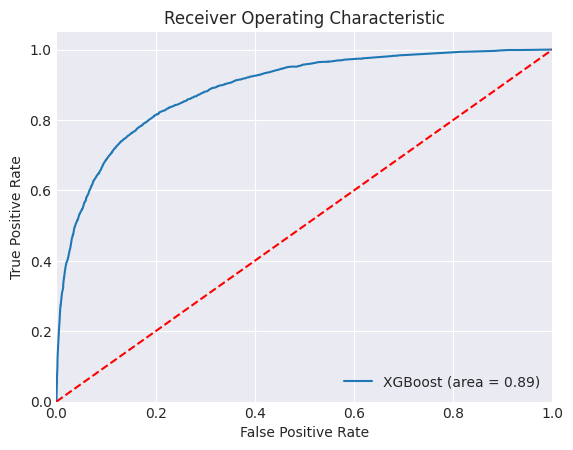

In [39]:
# Step 2: Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, y_test_pred_probs)

# Step 3: Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, label='XGBoost (area = %0.2f)' % roc_auc_score(y_test, y_test_pred_probs))
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()

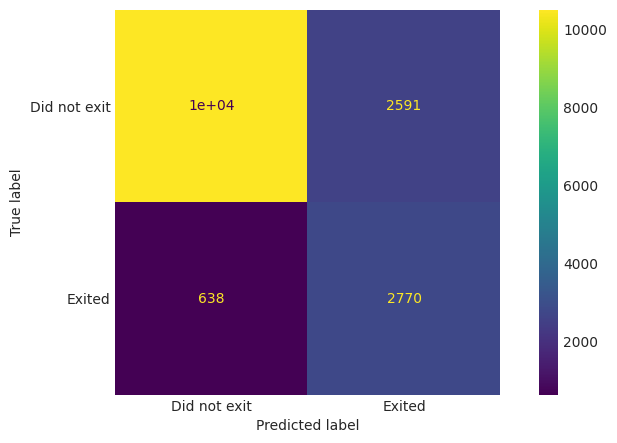

In [40]:
fig, ax = plt.subplots(figsize=(10, 5))

cm = confusion_matrix(y_test, y_pred, labels=clf_xgb.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,
                            display_labels=['Did not exit', 'Exited'])
disp.plot(ax=ax)
ax.grid(False)
plt.show()

In [41]:
print(classification_report(y_test, y_pred, target_names=['Did not exit', 'Exited']))

              precision    recall  f1-score   support

Did not exit       0.94      0.80      0.87     13082
      Exited       0.52      0.81      0.63      3408

    accuracy                           0.80     16490
   macro avg       0.73      0.81      0.75     16490
weighted avg       0.85      0.80      0.82     16490



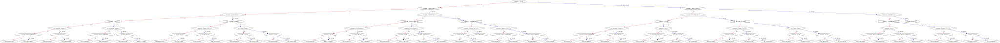

In [42]:
from graphviz import Source

graphviz_source = to_graphviz(clf_xgb, num_trees=0)
graphviz_source.render(filename='xgb_tree', format='png')
graphviz_source

<Figure size 1000x600 with 0 Axes>

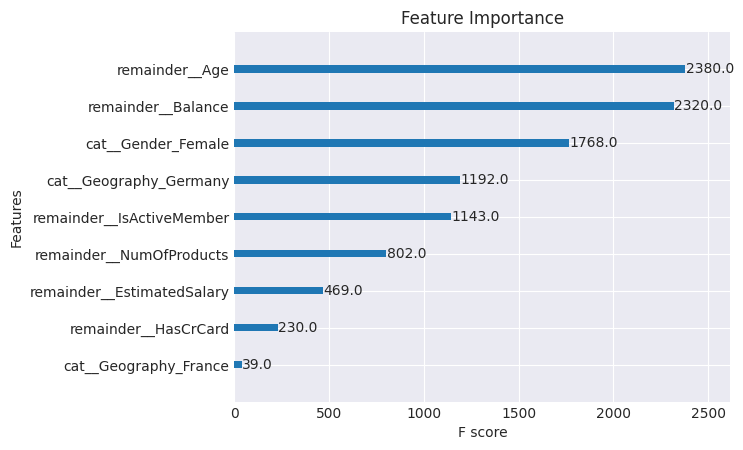

In [43]:
# Plot feature importance
plt.figure(figsize=(10, 6))
wt = plot_importance(clf_xgb, importance_type='weight')
plt.title('Feature Importance')
plt.show()

- **Weight**: The number of times a feature is used to split the data across all trees.
- Based on weight, Age is the most important feature.

<Figure size 1000x600 with 0 Axes>

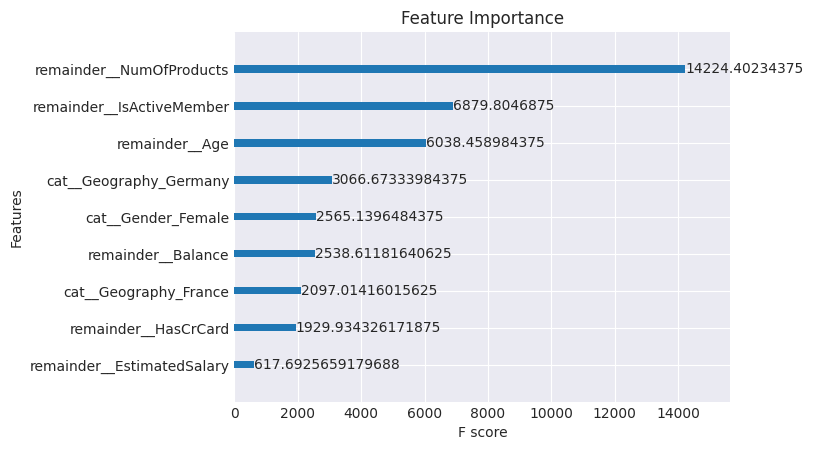

In [44]:
# Plot feature importance
plt.figure(figsize=(10, 6))
plot_importance(clf_xgb, importance_type='cover')
plt.title('Feature Importance')
plt.show()

- **Cover**: The number of times a feature is used to split the data across all trees weighted by the number of training data points that go through those splits.
- Based on Cover, NumOfProducts is the top feature.

<Figure size 1000x600 with 0 Axes>

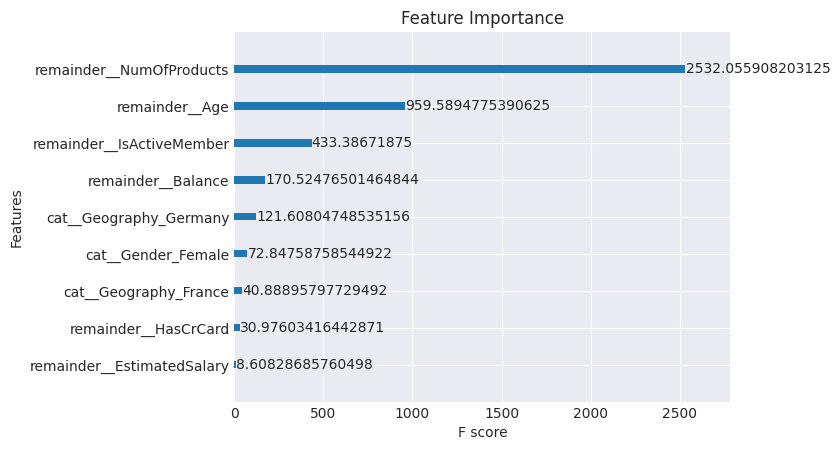

In [45]:
# Plot feature importance
plt.figure(figsize=(10, 6))
plot_importance(clf_xgb, importance_type='gain')
plt.title('Feature Importance')
plt.show()

- **Gain**: The average training loss reduction gained when using a feature for splitting.
- Based on gain, NumOfProducts is the top feature.

<a id='submission'></a>
# 📝 Submission

In [46]:
submission = pd.DataFrame()
submission["id"] = test_df.index
probabilities = clf_xgb.predict_proba(test_df)[:,1]
rounded_probabilities = probabilities.round(1)
submission["Exited"] = rounded_probabilities
submission.to_csv("submission.csv", header=True, index=False)
submission

,id,Exited
0,165034,0.2
1,165035,0.9
2,165036,0.2
3,165037,0.6
4,165038,0.7
...,...,...
110018,275052,0.2
110019,275053,0.3
110020,275054,0.2
110021,275055,0.5


<a id='shap'></a>
# 🌟 SHAP (SHapley Additive exPlanations)

- We will use SHAP values to explain the model and the effects of the features

In [47]:
shap.initjs()

In [48]:
explainer = shap.TreeExplainer(clf_xgb)
shap_values = explainer(X_test)

In [49]:
indices_to_pull = X_test.head(2).index
df.loc[indices_to_pull]

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
id,,,,,,,,,,,
32896,648,Germany,Male,41.0,4,98955.87,1,1.0,0.0,146821.42,0
8409,641,France,Male,32.0,7,0.00,2,1.0,1.0,162683.06,0


- We will analyze 1st 2 instances of X_test

In [50]:
actual_labels = y_test.head(2)

predictions = clf_xgb.predict(X_test.head(2))

predictions_proba = clf_xgb.predict_proba(X_test.head(2))

data = {
    'Actual_Labels': actual_labels.values,
    'Predicted_Labels': predictions,
    'Probability_of_Exit': predictions_proba[:, 1] # Probability of class 1 (exit)
}

df_results = pd.DataFrame(data, index=actual_labels.index)

df_results

,Actual_Labels,Predicted_Labels,Probability_of_Exit
id,,,
32896,0,1,0.736257
8409,0,0,0.131796


- Our model missclassified 1st one and correctly collect classified 2nd one.
- Let's see which features led to these probablilies.

       Actual_Labels  Predicted_Labels  Probability_of_Exit
id                                                         
32896              0                 1             0.736257


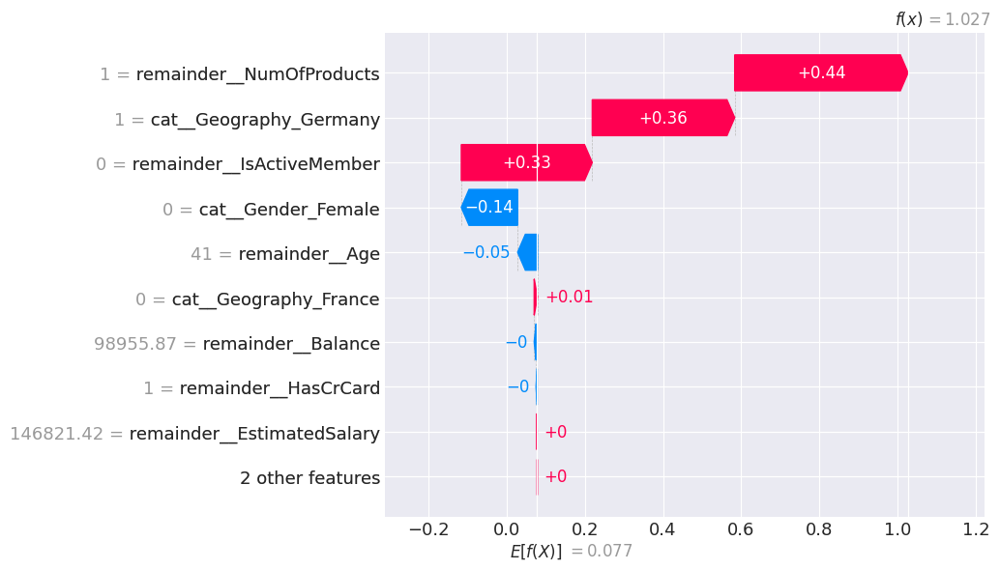

In [51]:
# 1st instance of test set.
print(df_results.head(1))
shap.plots.waterfall(shap_values[0])

      Actual_Labels  Predicted_Labels  Probability_of_Exit
id                                                        
8409              0                 0             0.131796


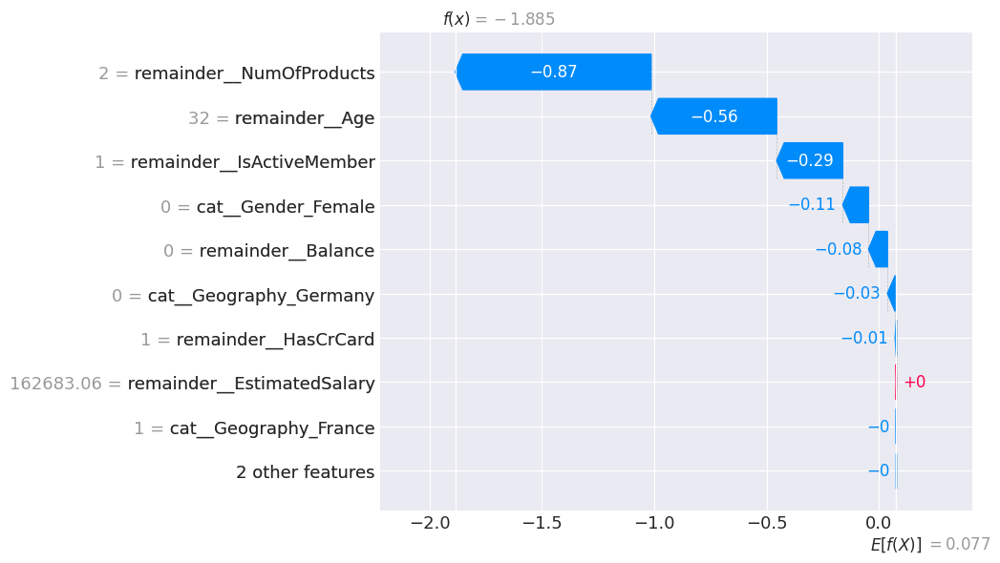

In [52]:
# 2st instance of test set.
print(df_results.tail(1))
shap.plots.waterfall(shap_values[1])

- NumOfProducts plays the highest role to make those decision.
- We will see below the contribution of each features for entire test set in our train model

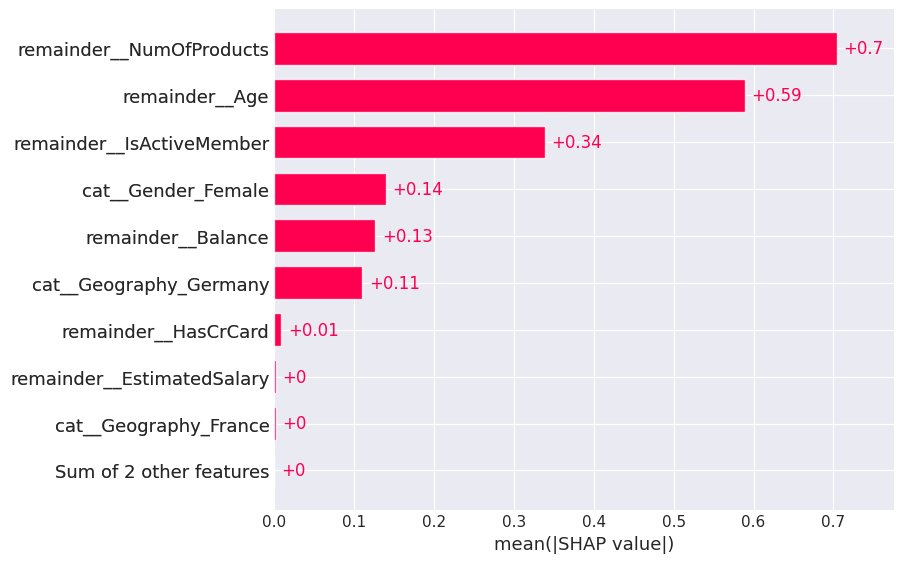

In [53]:
shap.plots.bar(shap_values)

- We can see that based on the SHAP values, NumOfProducts is the important feature followed by Age.

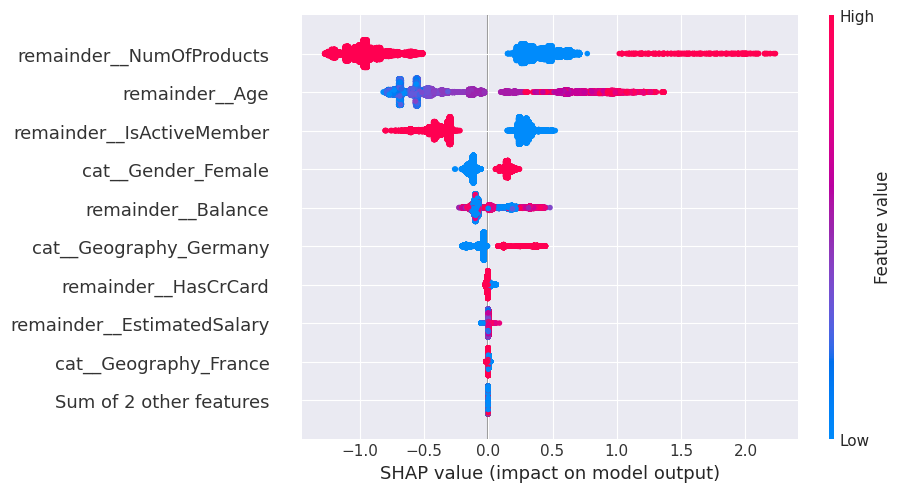

In [54]:
shap.plots.beeswarm(shap_values)

### Insights

- Red values indicate higher value of a feature and blue values indicate lower value of a feature.
- Customer who has lower and higher number of products leave the bank and the ones, who did not leave, had products somewhat between those numbers.
- Majority of young customers did not exit. Old people tends to exit more.

In [55]:
from IPython.display import HTML

force_plot = shap.plots.force(shap_values[:500])
from IPython.display import HTML
HTML(f"<div style='background-color:Lavender;'>{shap.getjs() + force_plot.html()}</div>")

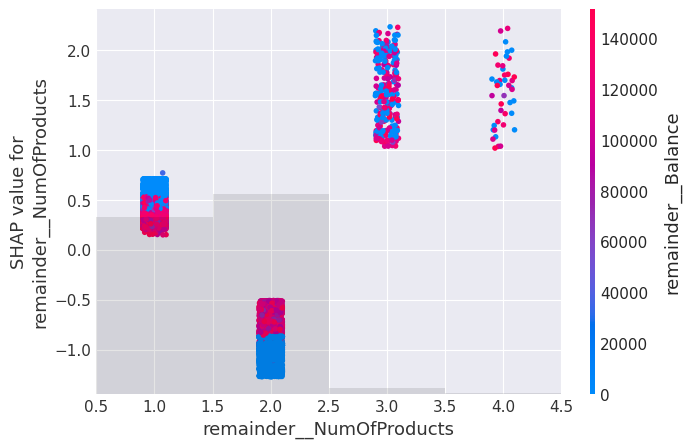

In [56]:
shap.plots.scatter(shap_values[:, "remainder__NumOfProducts"], color=shap_values)

- Shap values of NumberOfProudcts vs actual values of NumOfProducts scatterplot shows
- Balance is the best feature that interact with Num of Products

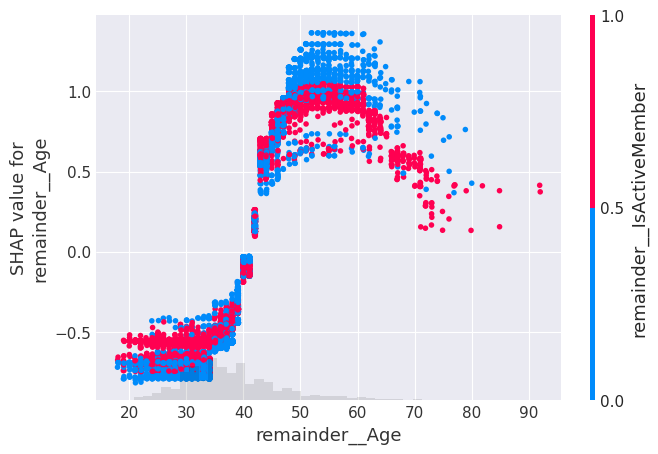

In [57]:
shap.plots.scatter(shap_values[:, "remainder__Age"], color=shap_values)

- Shap values of Age vs actual values of Age scatterplot shows
- IsActiveMember is the best feature that interact with Age